In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler
import plotly.express as px
from sklearn.cluster import MiniBatchKMeans, KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn_extra.cluster import KMedoids

In [117]:
data = pd.read_csv('C:/Users/DELL/Downloads/archive (7)/CC GENERAL.csv') # Set the customer's ID as index
cleaned_data = data.copy()
print(data.shape)
data.head()

(8950, 18)


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [62]:
data.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [121]:
data.dropna(subset = ['CREDIT_LIMIT'], inplace = True)
cleaned_data.dropna(subset = ['CREDIT_LIMIT'], inplace = True)


In [64]:
data[['PAYMENTS', 'MINIMUM_PAYMENTS']][data['MINIMUM_PAYMENTS'].isna()]

,PAYMENTS,MINIMUM_PAYMENTS
3,0.000000,NaN
45,0.000000,NaN
47,0.000000,NaN
54,417.016763,NaN
55,0.000000,NaN
...,...,...
8919,0.000000,NaN
8929,0.000000,NaN
8935,0.000000,NaN
8944,0.000000,NaN


In [65]:
print('Shape:', data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(data['MINIMUM_PAYMENTS'].notna()) & (data['PAYMENTS'] > data['MINIMUM_PAYMENTS'])].shape)
data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(data['MINIMUM_PAYMENTS'].notna()) & (data['PAYMENTS'] > data['MINIMUM_PAYMENTS'])].head()

Shape: (6272, 2)


,PAYMENTS,MINIMUM_PAYMENTS
0,201.802084,139.509787
1,4103.032597,1072.340217
4,678.334763,244.791237
6,6354.314328,198.065894
7,679.065082,532.033990


In [66]:
print('Shape:', data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(data['MINIMUM_PAYMENTS'].notna()) & (data['PAYMENTS'] < data['MINIMUM_PAYMENTS'])].shape)
data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(data['MINIMUM_PAYMENTS'].notna()) & (data['PAYMENTS'] < data['MINIMUM_PAYMENTS'])].head()

Shape: (2364, 2)


,PAYMENTS,MINIMUM_PAYMENTS
2,622.066742,627.284787
5,1400.057770,2407.246035
10,1083.301007,2172.697765
14,805.647974,989.962866
15,1993.439277,2109.906490


In [68]:
minpay = data['MINIMUM_PAYMENTS'].copy() 
payments_mean = np.mean(data['PAYMENTS']) 

i = 0
for payments, minpayments in zip(data['PAYMENTS'], data['MINIMUM_PAYMENTS'].isna()):
    if (payments == 0) and (minpayments == True):
        minpay[i] = 0
    elif (0 < payments < payments_mean) and (minpayments == True): 
        minpay[i] = payments
    elif minpayments == True: 
        minpay[i] = payments_mean
    i += 1
    
data['MINIMUM_PAYMENTS'] = minpay.copy()

data['MINIMUM_PAYMENTS'].fillna(payments_mean, inplace = True)

print(minpay)

0        139.509787
1       1072.340217
2        627.284787
3          0.000000
4        244.791237
           ...     
8945     275.861322
8946            NaN
8947      82.418369
8948      55.755628
8949      88.288956
Name: MINIMUM_PAYMENTS, Length: 8949, dtype: float64


In [69]:

data.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

Shape: (2344, 2)


,PAYMENTS,MINIMUM_PAYMENTS


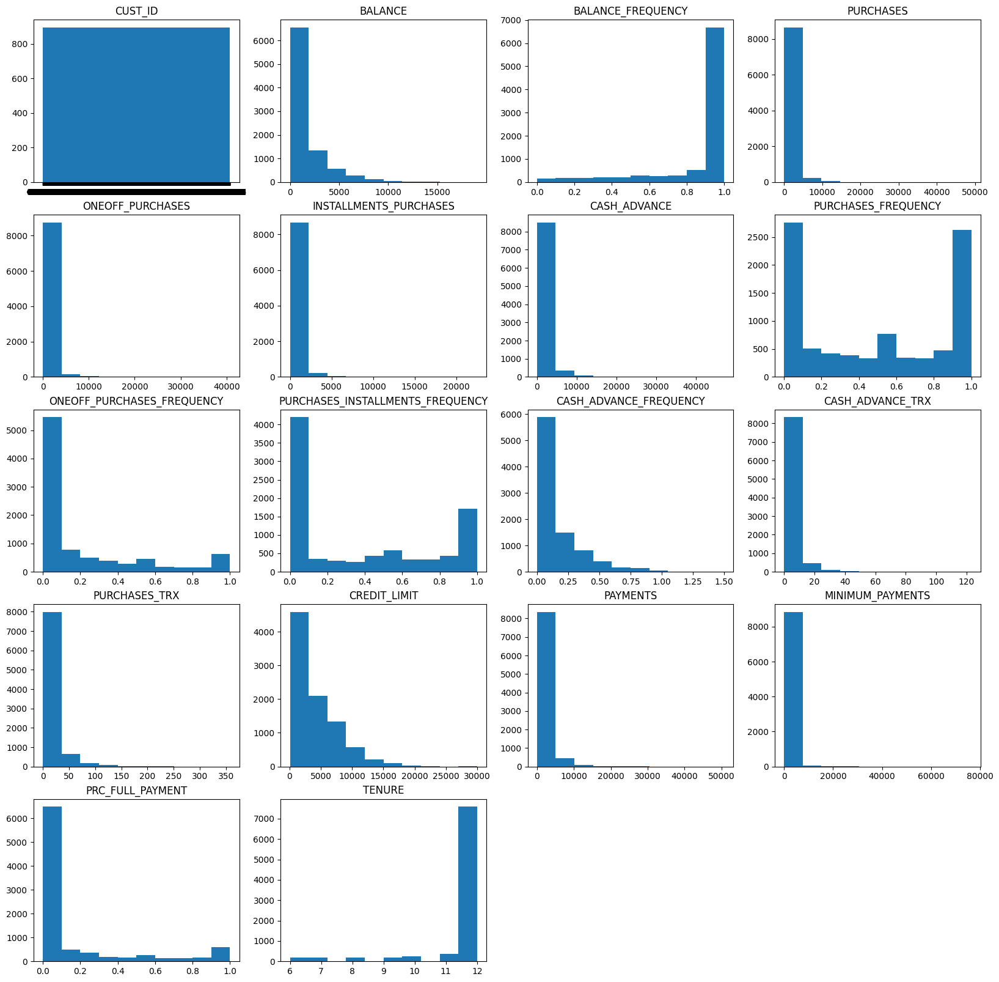

In [74]:
fig, axs = plt.subplots(nrows=5, ncols=4, figsize = (20,20))

z = 0
for i in range(5):
    for j in range(4):
        if z > 17:
            axs[i][j].axis(False)
        else:
            axs[i][j].set_title(data.iloc[:,z].name)
            axs[i][j].hist(data.iloc[:,z])
        z+=1

In [80]:
data = data.drop('CUST_ID', axis = 1)
logscaled_data = np.log2(data + 0.01)
logscaled_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,5.354408,-0.271980,6.576069,-6.643856,6.576069,-6.643856,-2.500896,-6.643856,-3.421469,-6.643856,-6.643856,1.007196,9.965799,7.656869,7.124326,-6.643856,3.586164
1,11.644973,-0.121720,-6.643856,-6.643856,-6.643856,12.653507,-6.643856,-6.643856,-6.643856,-1.943416,2.003602,-6.643856,12.773141,12.002478,10.066560,-2.106423,3.586164
2,11.284916,0.014355,9.594661,9.594661,-6.643856,-6.643856,0.014355,0.014355,-6.643856,-6.643856,-6.643856,3.586164,12.872677,9.280949,9.293000,-6.643856,3.586164
3,10.702762,-0.629581,10.549794,10.549794,-6.643856,7.685085,-3.421469,-3.421469,-6.643856,-3.421469,0.014355,0.014355,12.872677,-6.643856,-6.643856,-6.643856,3.586164
4,9.675471,0.014355,4.000901,4.000901,-6.643856,-6.643856,-3.421469,-3.421469,-6.643856,-6.643856,-6.643856,0.014355,10.228831,9.405875,7.935467,-6.643856,3.586164


In [86]:
minMaxScaler = MinMaxScaler().fit_transform(logscaled_data)

In [87]:
standardScaler = StandardScaler().fit_transform(logscaled_data)

In [88]:
robustScaler = RobustScaler().fit_transform(logscaled_data)

In [89]:
maxAbsScaler = MaxAbsScaler().fit_transform(logscaled_data)

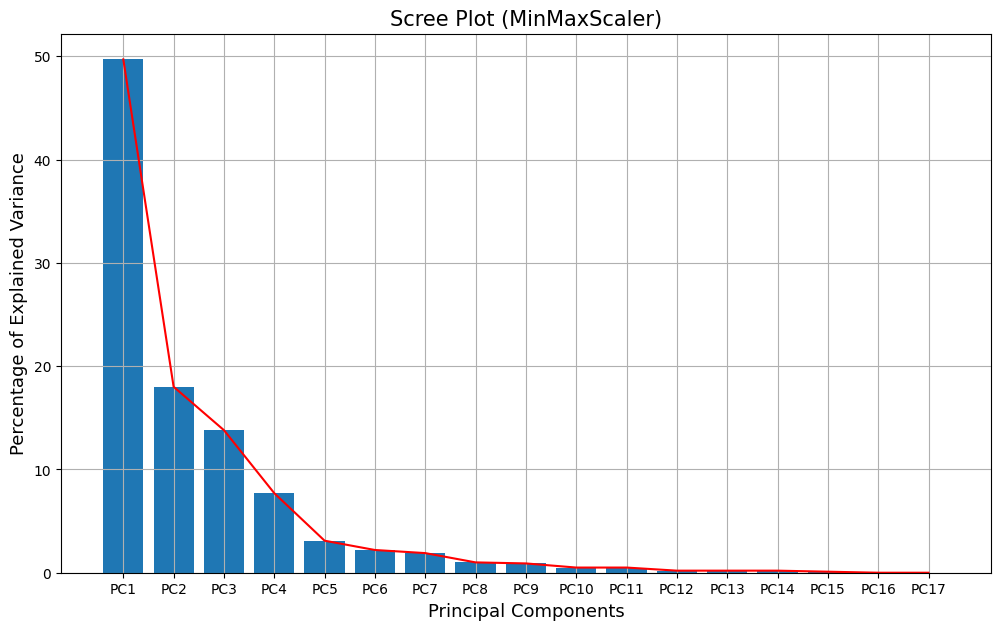

81.5% variance of the dataset lies on the first 3 Principal Components


In [91]:
pca = PCA (n_components = 17)
pca.fit(minMaxScaler)
pca_data = pca.transform(minMaxScaler)

def scree_plot(pca, scaler):
    per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
    labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]

    plt.figure(figsize = (12,7))
    plt.bar(x = range(1,len(per_var)+1), height = per_var, tick_label = labels)
    plt.plot(range(1,len(per_var)+1), per_var, c = 'red')
    plt.ylabel('Percentage of Explained Variance', size = 13)
    plt.xlabel('Principal Components', size = 13)
    plt.title('Scree Plot (%s)' %(scaler), size = 15)
    plt.grid()
    plt.show()
    print('%s%% variance of the dataset lies on the first 3 Principal Components'  %(np.sum(per_var[:3])))

scree_plot(pca, 'MinMaxScaler')

In [92]:
def scatter_plot3D(pca_data):
    x, y, z = pca_data[:,:3].T
    fig = px.scatter_3d(x = x, 
                        y = y, 
                        z = z)
    fig.show()
    
scatter_plot3D(pca_data)

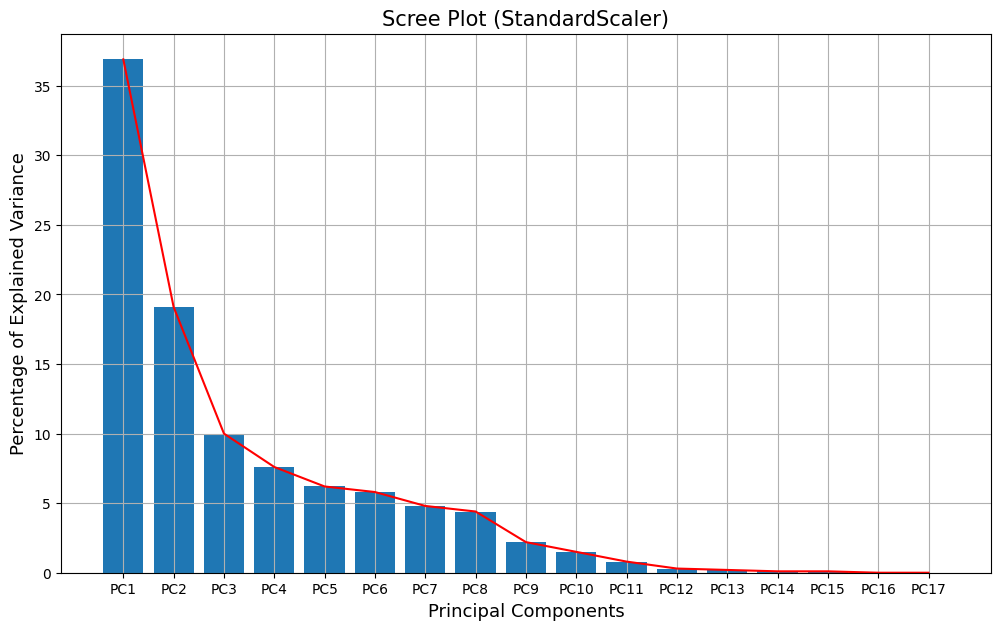

66.0% variance of the dataset lies on the first 3 Principal Components


In [93]:
pca = PCA(n_components = 17)
pca.fit(standardScaler)
pca_data = pca.transform(standardScaler)

scree_plot(pca, 'StandardScaler')

In [94]:
scatter_plot3D(pca_data)

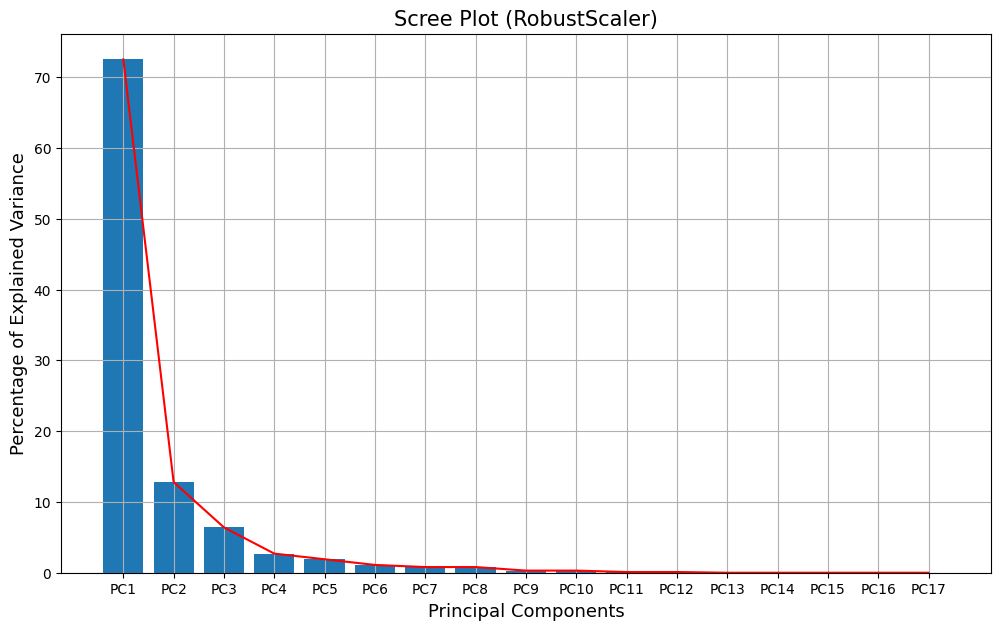

91.7% variance of the dataset lies on the first 3 Principal Components


In [95]:
pca = PCA(n_components = 17)
pca.fit(robustScaler)
pca_data = pca.transform(robustScaler)

scree_plot(pca, 'RobustScaler')

In [96]:
scatter_plot3D(pca_data)

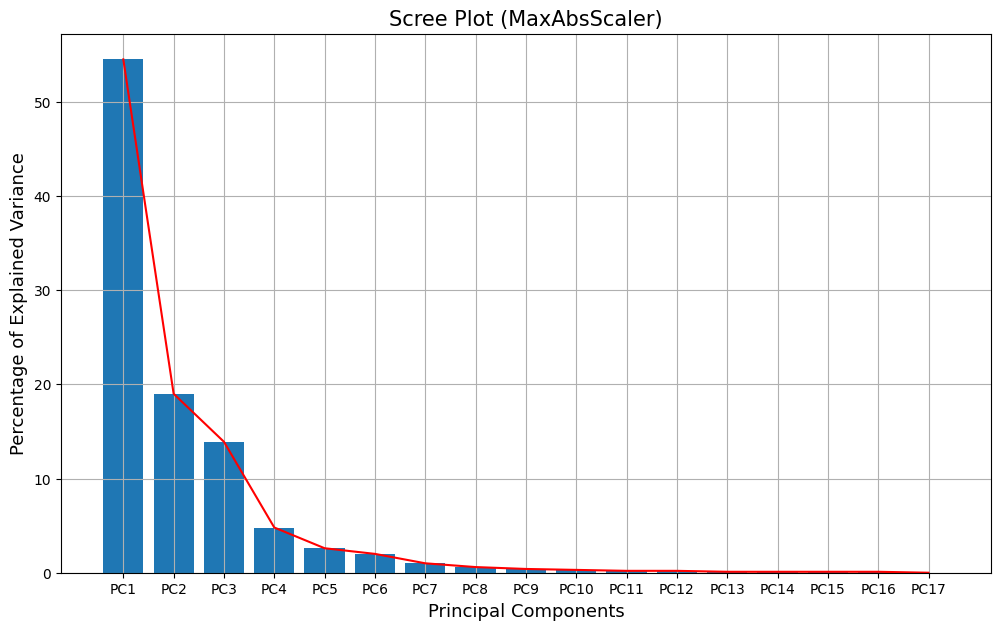

87.4% variance of the dataset lies on the first 3 Principal Components


In [97]:
pca = PCA(n_components = 17)
pca.fit(maxAbsScaler)
pca_data = pca.transform(maxAbsScaler)

scree_plot(pca, 'MaxAbsScaler')

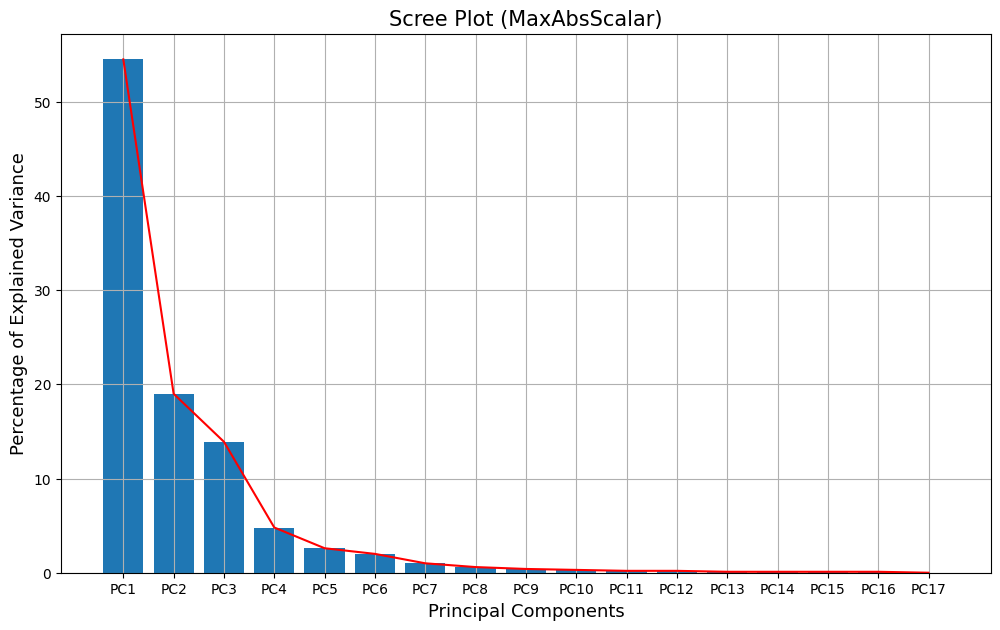

87.4% variance of the dataset lies on the first 3 Principal Components


In [98]:
scree_plot(pca, 'MaxAbsScalar')

In [99]:
scatter_plot3D(pca_data)

In [100]:
pca = PCA(n_components = 17)
pca.fit(minMaxScaler)
pca_data = pca.transform(minMaxScaler)
top3_pc = pca_data[:,:3]

In [101]:
inertia = []
silh = []

for i in range(2,10):
    kmeans = KMeans(n_clusters = i) 
    kmeans.fit(top3_pc)
    inertia.append(kmeans.inertia_)
    silh.append(silhouette_score(top3_pc, kmeans.labels_))

C:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warni

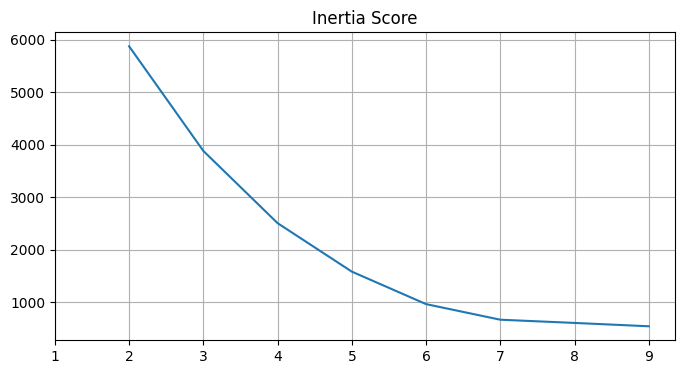

In [102]:
plt.figure(figsize = (8,4))
plt.plot(range(2,10), inertia)
plt.title('Inertia Score')
plt.xticks(range(1,10))
plt.grid()
plt.show()

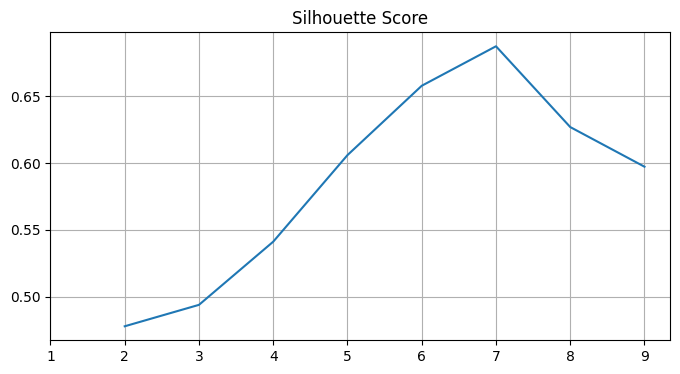

In [103]:
plt.figure(figsize = (8,4))
plt.plot(range(2,10), silh)
plt.title('Silhouette Score')
plt.xticks(range(1,10))
plt.grid()
plt.show()

In [104]:
kmeans = KMeans(n_clusters=7)
kmeans.fit(top3_pc)
kmeans_labels = kmeans.labels_

C:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [105]:
x, y, z = top3_pc.T

fig = px.scatter_3d(x = x, 
                    y = y, 
                    z = z,
                    color = kmeans_labels)
fig.show()

In [106]:
inertia = []
silh = []

for i in range(2,10):
    kmedoids = KMedoids(n_clusters = i) 
    kmedoids.fit(top3_pc)
    inertia.append(kmedoids.inertia_)
    silh.append(silhouette_score(top3_pc, kmedoids.labels_))

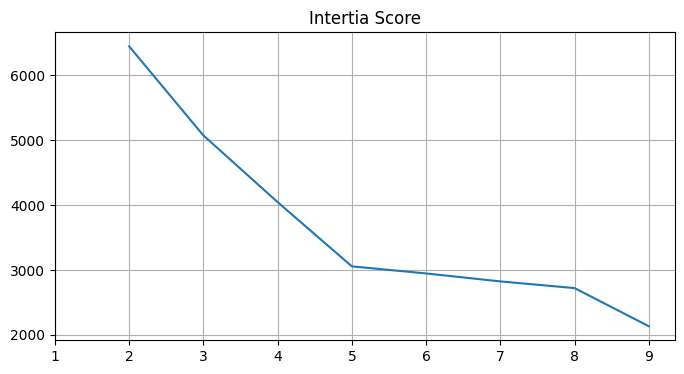

In [109]:
plt.figure(figsize = (8,4))
plt.plot(range(2,10), inertia)
plt.title('Intertia Score')
plt.xticks(range(1,10))
plt.grid()
plt.show()

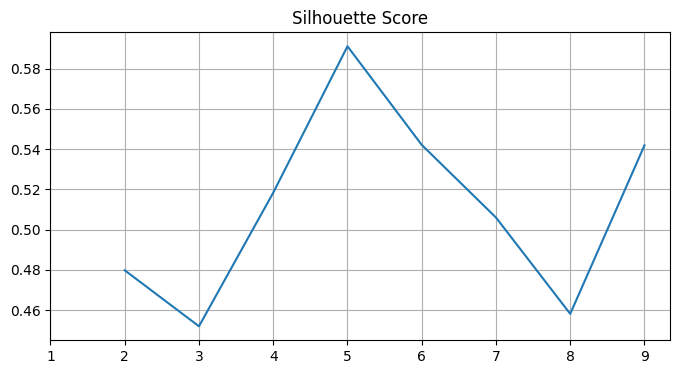

In [110]:
plt.figure(figsize = (8,4))
plt.plot(range(2,10), silh)
plt.title('Silhouette Score')
plt.xticks(range(1,10))
plt.grid()
plt.show()

In [111]:
kmedoids = KMedoids(n_clusters = 5)
kmedoids.fit(top3_pc)
kmedoids_labels = kmedoids.labels_

In [112]:
x, y, z = top3_pc.T
fig = px.scatter_3d(x = x, 
                    y = y, 
                    z = z,
                    color = kmeans_labels)
fig.show()

In [113]:
dbscan = DBSCAN(eps = 0.2) 
dbscan.fit(top3_pc)
dbscan_labels = dbscan.labels_

In [114]:
x, y, z = top3_pc.T

fig = px.scatter_3d(x = x, 
                    y = y, 
                    z = z,
                    color = dbscan_labels)
fig.show()

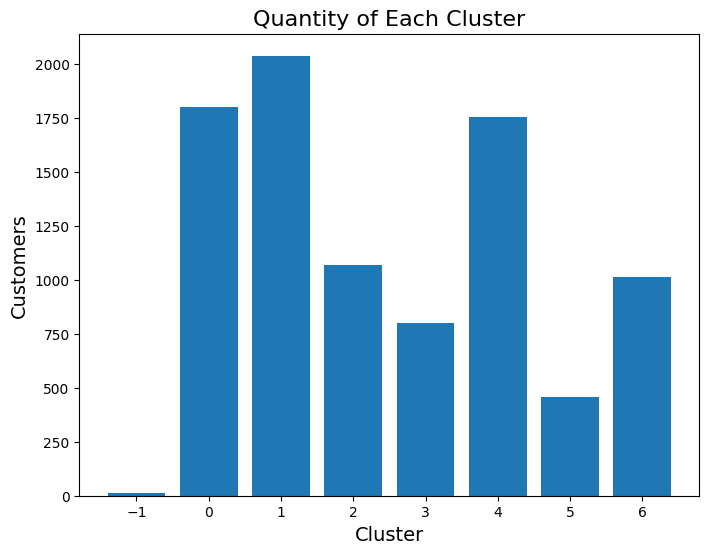

Cluster -1: 12
Cluster 0: 1800
Cluster 1: 2040
Cluster 2: 1068
Cluster 3: 800
Cluster 4: 1754
Cluster 5: 459
Cluster 6: 1016


In [115]:
labels, counts = np.unique(dbscan_labels, return_counts = True)

plt.figure(figsize = (8,6))
plt.title('Quantity of Each Cluster', size = 16)
plt.bar(labels, counts)
plt.xlabel('Cluster', size = 14)
plt.ylabel('Customers', size = 14)
plt.xticks(labels)
plt.show()

for i in zip(labels, counts):
    print('Cluster %s: %s' %(i[0],i[1]))

In [122]:
final_data = cleaned_data.copy()
cleaned_data.drop('CUST_ID', axis = 1)
final_data['Label'] = dbscan_labels
final_data.drop(final_data[final_data['Label'] == -1].index, inplace = True) # Drop the 12 Anomaly Customers
final_data.to_csv('final_data.csv') # save final dataset for next step, interpretation, conclusion, and recommendation
final_data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Label
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,2
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12,3
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,2


In [123]:
for i in range(7):
    print('Cluster:', i)
    display(final_data[final_data['Label'] == i].describe())
    print('\n')

Cluster: 0


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Label
count,1800.000000,1800.000000,1800.000000,1800.0,1800.000000,1800.0,1800.000000,1800.0,1800.000000,1800.0,1800.0,1800.000000,1800.000000,1800.000000,1693.000000,1800.000000,1800.000000,1800.0
mean,399.097003,0.788155,537.509883,0.0,538.518811,0.0,0.705799,0.0,0.672243,0.0,0.0,11.808889,3115.340769,748.171706,715.799530,0.305677,11.508333,0.0
std,917.224800,0.299982,887.469328,0.0,889.463488,0.0,0.306385,0.0,0.309151,0.0,0.0,12.189906,2705.761507,1330.483202,3344.900737,0.368361,1.373916,0.0
min,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.083333,0.0,0.083333,0.0,0.0,0.000000,300.000000,0.000000,0.019163,0.000000,6.000000,0.0
25%,18.292113,0.636364,154.965000,0.0,154.965000,0.0,0.416667,0.0,0.416667,0.0,0.0,6.000000,1400.000000,207.674300,116.745902,0.000000,12.000000,0.0
50%,56.153365,1.000000,321.360000,0.0,322.145000,0.0,0.833333,0.0,0.750000,0.0,0.0,10.000000,2500.000000,419.260438,164.361594,0.090909,12.000000,0.0
75%,288.875684,1.000000,601.897500,0.0,604.620000,0.0,1.000000,0.0,1.000000,0.0,0.0,12.000000,4000.000000,825.695754,216.090433,0.600000,12.000000,0.0
max,11670.179850,1.000000,22500.000000,0.0,22500.000000,0.0,1.000000,0.0,1.000000,0.0,0.0,199.000000,23000.000000,28988.973880,76406.207520,1.000000,12.000000,0.0




Cluster: 1


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Label
count,2040.000000,2040.000000,2040.0,2040.0,2040.0,2040.000000,2040.0,2040.0,2040.0,2040.000000,2040.000000,2040.000000,2040.000000,2040.000000,1964.000000,2040.000000,2040.000000,2040.0
mean,2149.664740,0.882678,0.0,0.0,0.0,1990.325254,0.0,0.0,0.0,0.272880,6.305392,0.001471,4026.503268,1655.210235,1004.996989,0.044411,11.320098,1.0
std,2113.268492,0.232116,0.0,0.0,0.0,2471.452233,0.0,0.0,0.0,0.201225,8.086606,0.049498,3261.272236,2718.401942,2617.573147,0.138323,1.545767,0.0
min,0.000000,0.000000,0.0,0.0,0.0,18.042768,0.0,0.0,0.0,0.083333,1.000000,0.000000,50.000000,0.000000,0.117036,0.000000,6.000000,1.0
25%,750.807900,0.900000,0.0,0.0,0.0,380.582133,0.0,0.0,0.0,0.090909,2.000000,0.000000,1500.000000,360.152255,266.811486,0.000000,12.000000,1.0
50%,1455.806773,1.000000,0.0,0.0,0.0,1203.200490,0.0,0.0,0.0,0.250000,4.000000,0.000000,3000.000000,763.250270,487.243851,0.000000,12.000000,1.0
75%,2843.531335,1.000000,0.0,0.0,0.0,2705.281169,0.0,0.0,0.0,0.333333,8.000000,0.000000,6000.000000,1725.724856,1007.932823,0.000000,12.000000,1.0
max,14581.459140,1.000000,0.0,0.0,0.0,26194.049540,0.0,0.0,0.0,1.500000,123.000000,2.000000,19000.000000,34107.074990,61031.618600,1.000000,12.000000,1.0




Cluster: 2


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Label
count,1068.000000,1068.000000,1068.000000,1068.000000,1068.0,1068.0,1068.000000,1068.000000,1068.0,1068.0,1068.0,1068.000000,1068.000000,1068.000000,1003.000000,1068.000000,1068.000000,1068.0
mean,765.118423,0.770599,884.362060,884.450009,0.0,0.0,0.355772,0.355460,0.0,0.0,0.0,7.752809,4424.260867,1204.080306,498.722265,0.136248,11.556180,2.0
std,1184.945100,0.302626,1406.485161,1406.463181,0.0,0.0,0.313581,0.313686,0.0,0.0,0.0,13.826571,3612.531575,2351.108514,1646.789608,0.293366,1.273193,0.0
min,0.000000,0.000000,4.990000,4.990000,0.0,0.0,0.083333,0.083333,0.0,0.0,0.0,1.000000,150.000000,0.000000,4.763689,0.000000,6.000000,2.0
25%,45.611722,0.545455,153.567500,153.567500,0.0,0.0,0.083333,0.083333,0.0,0.0,0.0,1.000000,1600.000000,287.966915,124.114211,0.000000,12.000000,2.0
50%,246.239506,1.000000,444.585000,444.585000,0.0,0.0,0.250000,0.250000,0.0,0.0,0.0,4.000000,3000.000000,577.219671,193.337889,0.000000,12.000000,2.0
75%,1089.196875,1.000000,1027.467500,1027.467500,0.0,0.0,0.500000,0.500000,0.0,0.0,0.0,10.000000,6500.000000,1297.815331,417.297994,0.083333,12.000000,2.0
max,12323.845360,1.000000,17945.000000,17945.000000,0.0,0.0,1.000000,1.000000,0.0,0.0,0.0,217.000000,25000.000000,50721.483360,30528.432400,1.000000,12.000000,2.0




Cluster: 3


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Label
count,800.000000,800.000000,800.000000,800.000000,800.0,800.000000,800.000000,800.000000,800.0,800.000000,800.000000,800.000000,800.000000,800.000000,774.000000,800.000000,800.000000,800.0
mean,2339.339233,0.925242,662.359262,662.402663,0.0,2022.704401,0.276355,0.276251,0.0,0.293387,6.838750,6.298750,4635.280682,1918.202050,1027.732962,0.057875,11.351250,3.0
std,2274.089166,0.170334,1500.641312,1500.624015,0.0,2480.758292,0.252947,0.253009,0.0,0.212404,7.741619,13.519077,3499.531380,2911.528522,1685.395057,0.166030,1.516822,0.0
min,0.000000,0.000000,0.700000,0.700000,0.0,18.280043,0.083333,0.083333,0.0,0.083333,1.000000,1.000000,200.000000,0.000000,3.197940,0.000000,6.000000,3.0
25%,824.222601,1.000000,112.892500,112.892500,0.0,369.801842,0.083333,0.083333,0.0,0.142857,2.000000,1.000000,2000.000000,483.481410,263.836961,0.000000,12.000000,3.0
50%,1602.935071,1.000000,296.500000,296.500000,0.0,1147.626713,0.166667,0.166667,0.0,0.250000,4.000000,3.000000,3500.000000,1073.241874,546.921879,0.000000,12.000000,3.0
75%,3123.585136,1.000000,722.327500,722.327500,0.0,2746.431489,0.333333,0.333333,0.0,0.416667,9.000000,7.000000,6500.000000,2207.114116,1161.041879,0.000000,12.000000,3.0
max,15258.225900,1.000000,22101.780000,22101.780000,0.0,20277.331120,1.000000,1.000000,0.0,1.250000,93.000000,309.000000,20000.000000,39461.965800,19060.534750,1.000000,12.000000,3.0




Cluster: 4


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Label
count,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.0,1754.000000,1754.000000,1754.000000,1754.0,1754.0,1754.000000,1754.000000,1754.000000,1730.000000,1754.000000,1754.000000,1754.0
mean,1215.810527,0.933138,2466.373877,1509.294498,957.107315,0.0,0.811534,0.460566,0.645427,0.0,0.0,34.450969,5701.198300,2278.177326,613.768374,0.256301,11.803307,4.0
std,1814.197708,0.161842,3493.283391,2778.278013,1335.254023,0.0,0.239218,0.332985,0.313076,0.0,0.0,36.496296,4003.933206,3248.175844,1627.807772,0.357521,0.840755,0.0
min,0.000000,0.000000,34.000000,1.400000,1.950000,0.0,0.083333,0.083333,0.083333,0.0,0.0,2.000000,300.000000,0.000000,13.545097,0.000000,6.000000,4.0
25%,165.743448,1.000000,734.542500,265.680000,228.085000,0.0,0.666667,0.166667,0.416667,0.0,0.0,13.000000,2500.000000,686.526401,169.881307,0.000000,12.000000,4.0
50%,532.602975,1.000000,1523.780000,763.910000,537.770000,0.0,0.916667,0.363636,0.666667,0.0,0.0,24.000000,5000.000000,1333.579206,213.257827,0.000000,12.000000,4.0
75%,1514.433303,1.000000,2841.732500,1736.450000,1173.627500,0.0,1.000000,0.750000,1.000000,0.0,0.0,41.750000,7500.000000,2595.824063,549.154752,0.500000,12.000000,4.0
max,19043.138560,1.000000,41050.400000,40624.060000,15497.190000,0.0,1.000000,1.000000,1.000000,0.0,0.0,358.000000,30000.000000,36066.750680,29019.802880,1.000000,12.000000,4.0




Cluster: 5


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Label
count,459.000000,459.000000,459.000000,459.0,459.000000,459.000000,459.000000,459.0,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000,454.000000,459.000000,459.000000,459.0
mean,2573.012441,0.956558,535.698780,0.0,536.349739,2057.882568,0.653363,0.0,0.606115,0.262729,6.217865,12.285403,4362.962963,1956.871227,1449.791966,0.047129,11.318083,5.0
std,2595.369724,0.125326,848.017489,0.0,847.935271,2547.415929,0.313939,0.0,0.314633,0.197861,8.959420,19.526245,3616.243488,3078.958467,2536.238717,0.128374,1.615671,0.0
min,1.097736,0.181818,4.440000,0.0,4.440000,18.531069,0.083333,0.0,0.083333,0.083333,1.000000,1.000000,500.000000,0.000000,9.801394,0.000000,6.000000,5.0
25%,881.448811,1.000000,158.220000,0.0,158.220000,502.974100,0.348484,0.0,0.333333,0.083333,2.000000,5.000000,1500.000000,576.102146,356.328019,0.000000,12.000000,5.0
50%,1630.991993,1.000000,336.000000,0.0,337.980000,1136.000468,0.700000,0.0,0.666667,0.166667,4.000000,9.000000,3000.000000,1133.806322,820.416670,0.000000,12.000000,5.0
75%,3345.264609,1.000000,628.150000,0.0,628.150000,2683.188586,1.000000,0.0,0.909091,0.333333,7.000000,13.000000,6000.000000,2057.663108,1592.478282,0.000000,12.000000,5.0
max,16304.889250,1.000000,14686.100000,0.0,14686.100000,19862.878440,1.000000,0.0,1.000000,1.000000,123.000000,347.000000,19000.000000,40627.595240,31871.363790,1.000000,12.000000,5.0




Cluster: 6


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Label
count,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1007.000000,1016.000000,1016.000000,1016.0
mean,2830.707087,0.968499,1932.566181,1161.906299,770.962215,2086.060876,0.777953,0.396348,0.628420,0.291543,7.732283,30.463583,5805.030621,3012.754434,1244.404648,0.069201,11.616142,6.0
std,2616.234840,0.097353,2532.640932,1935.701476,1035.206276,3104.347343,0.247211,0.289574,0.309676,0.213333,9.726566,29.738974,4137.892696,4083.769575,1769.390826,0.175968,1.195350,0.0
min,2.299436,0.090909,64.820000,0.020000,9.650000,14.222216,0.083333,0.083333,0.083333,0.083333,1.000000,2.000000,300.000000,0.000000,27.398111,0.000000,6.000000,6.0
25%,894.763339,1.000000,603.182500,226.675000,183.322500,395.515231,0.583333,0.166667,0.363636,0.089015,2.000000,11.000000,2500.000000,871.322235,337.072749,0.000000,12.000000,6.0
50%,2009.365387,1.000000,1235.355000,613.075000,445.615000,1116.127769,0.875000,0.333333,0.666667,0.250000,4.000000,21.000000,5000.000000,1741.088455,751.737661,0.000000,12.000000,6.0
75%,4008.788212,1.000000,2392.052500,1402.025000,1019.610000,2646.855311,1.000000,0.583333,0.916667,0.416667,10.000000,39.000000,8000.000000,3485.648592,1460.228018,0.083333,12.000000,6.0
max,16259.448570,1.000000,49039.570000,40761.250000,13184.430000,47137.211760,1.000000,1.000000,1.000000,1.000000,123.000000,308.000000,30000.000000,46930.598240,22011.779800,1.000000,12.000000,6.0
